In [75]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt

import skmob
from skmob.utils import utils, constants
import geopandas as gpd

In [2]:
df = pd.read_excel("metro-to-metro-2010-2014.xlsx",header=[1,2,3],skipfooter=406)

In [3]:
df

Current Residence Metro Code1 Residence 1 Year Ago Metro Code1  \
                 Unnamed: 0_level_1               Unnamed: 1_level_1   
                 Unnamed: 0_level_2               Unnamed: 1_level_2   
0                             10180                            10740   
1                             10180                            10900   
2                             10180                            11100   
3                             10180                            11260   
4                             10180                            12060   
...                             ...                              ...   
52712                         49740                            ASI--   
52713                         49740                            CAM--   
52714                         49740                            CAR--   
52715                         49740                            EUR--   
52716                         49740                            ISL--   

      Metropolitan Statistical Area of Current Residence  \
                                      Unnamed: 2_level_1   
                                      Unnamed: 2_level_2   
0                                 Abilene, TX Metro Area   
1                                 Abilene, TX Metro Area   
2                                 Abilene, TX Metro Area   
3                                 Abilene, TX Metro Area   
4                                 Abilene, TX Metro Area   
...                                                  ...   
52712                                Yuma, AZ Metro Area   
52713                                Yuma, AZ Metro Area   
52714                                Yuma, AZ Metro Area   
52715                                Yuma, AZ Metro Area   
52716                                Yuma, AZ Metro Area   

                                                       \
      Population 1 Year and Over      Nonmovers         
                        Estimate  MOE  Estimate   MOE   
0                         164878  324    126811  2022   
1                         164878  324    126811  2022   
2                         164878  324    126811  2022   
3                         164878  324    126811  2022   
4                         164878  324    126811  2022   
...                          ...  ...       ...   ...   
52712                     199154  322    163741  1813   
52713                     199154  322    163741  1813   
52714                     199154  322    163741  1813   
52715                     199154  322    163741  1813   
52716                     199154  322    163741  1813   

                                                              \
      Movers within Same Metropolitan Statistical Area         
                                              Estimate   MOE   
0                                                23510  1557   
1                                                23510  1557   
2                                                23510  1557   
3                                                23510  1557   
4                                                23510  1557   
...                                                ...   ...   
52712                                            20592  1590   
52713                                            20592  1590   
52714                                            20592  1590   
52715                                            20592  1590   
52716                                            20592  1590   

                                                            ...  \
      Movers from Different Metropolitan Statistical Area2  ...   
                                                  Estimate  ...   
0                                                   9952    ...   
1                                                   9952    ...   
2                                                   9952    ...   
3                                                   9952  

In [4]:
len(df.iloc[:,0].unique())

388

In [5]:
df.iloc[:,3].unique().sum()

268091142

In [6]:
df[df.iloc[:,3]==df.iloc[:,3].unique().min()]

Current Residence Metro Code1 Residence 1 Year Ago Metro Code1  \
                Unnamed: 0_level_1               Unnamed: 1_level_1   
                Unnamed: 0_level_2               Unnamed: 1_level_2   
7538                         16180                            11260   
7539                         16180                            15380   
7540                         16180                            16740   
7541                         16180                            16860   
7542                         16180                            17140   
7543                         16180                            17300   
7544                         16180                            17460   
7545                         16180                            19740   
7546                         16180                            20260   
7547                         16180                            23420   
7548                         16180                            24300   
7549                         16180                            25420   
7550                         16180                            28140   
7551                         16180                            29420   
7552                         16180                            29820   
7553                         16180                            31080   
7554                         16180                            32780   
7555                         16180                            33700   
7556                         16180                            33780   
7557                         16180                            34580   
7558                         16180                            37100   
7559                         16180                            37340   
7560                         16180                            37980   
7561                         16180                            38060   
7562                         16180                            38900   
7563                         16180                            39660   
7564                         16180                            39900   
7565                         16180                            40140   
7566                         16180                            40380   
7567                         16180                            40420   
7568                         16180                            40900   
7569                         16180                            41420   
7570                         16180                            41540   
7571                         16180                            41620   
7572                         16180                            41700   
7573                         16180                            41740   
7574                         16180                            41860   
7575                         16180                            41940   
7576                         16180                            42100   
7577                         16180                            42200   
7578                         16180                            42660   
7579                         16180                            43620   
7580                         16180                            44060   
7581                         16180                            44700   
7582                         16180                            45300   
7583                         16180                            45940   
7584                         16180                            46060   
7585                         16180                            46700   
7586                         16180                            47900   
7587                         16180                            99999   
7588                         16180                            ASI--   
7589                         16180                            CAM--   

     Metropolitan Statistical Area of Current Residence  \
                                     Unn

## Fitting issues

In [151]:
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score

def func(x, a, b):
    return a * x**b

def paramsPlot(xdata,ydata):
    ## curve fit
    popt, pcov = curve_fit(func, xdata, ydata,maxfev=10000) # non-linear least squares to fit a function

    yhat1 = [func(i, popt[0],popt[1]) for i in xdata]
    r2_NLS = r2_score(ydata, yhat1)
    print("NLS Fit alpha:",popt[0],"\nNLS Fit beta:",popt[1],"\nNLS R2:", r2_NLS)
    print("*"*60)
    
    ## ols fit
    xd = np.log(xdata)
    yd = np.log(ydata)

    par= np.polyfit(xd,yd,1)
    k = par[0]
    m = par[1]

    logyhat = k*xd+m
    yhat2 = np.exp(logyhat)
    r2_OLS = r2_score(ydata, yhat2)
    print("OLS Fit alpha:",m ,"\nOLS Fit beta:",k,"\nOLS R2:", r2_OLS)
    print("*"*60)
    
    ## plot
    fig,ax = plt.subplots(1,2,figsize = (12,5))

    ax[0].scatter(xdata,ydata,s=10)
    ax[0].plot(sorted(list(xdata)),sorted(list(yhat1)),'r--',label ="NLS line" )
    ax[0].plot(sorted(list(xdata)),sorted(list(yhat2)),"g--",label ="OLS line")## OLS fit
    ax[0].legend()
    ax[0].grid()
    ax[0].set_xlim(0.7*min(xdata),1.3*max(xdata))
    ax[0].set_ylim(0.7*min(ydata),1.3*max(ydata))

    ax[1].set_yscale("log")
    ax[1].set_xscale("log")
    ax[1].scatter(xdata,ydata,s=10)
    ax[1].loglog(xdata,yhat1,'r--',label ="NLS line" )
    ax[1].loglog(xdata,yhat2,"g--",label ="OLS line")## OLS fit
    ax[1].grid(which = "both")
    ax[1].legend()
    ax[1].set_xlim(0.7*min(xdata),1.3*max(xdata))
    ax[1].set_ylim(0.7*min(ydata),1.3*max(ydata))

    return fig,ax

True alpha: 2.5 
True beta=== 1.3
************************************************************
NLS Fit alpha: 2.386875321417568 
NLS Fit beta: 1.3056418629880517 
NLS R2: 0.9928992805277147
************************************************************
OLS Fit alpha: 1.0708874301240812 
OLS Fit beta: 1.2810912392041096 
OLS R2: 0.991661037861746
************************************************************


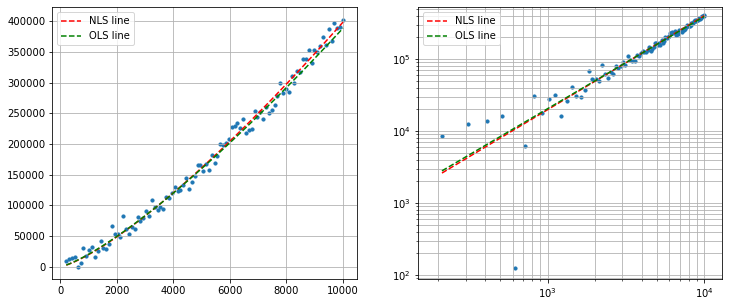

In [152]:
## 生成一个 y = a * x^b 的数据 
a = 2.5
b = 1.3

noise_sigma = 10000

xdata = np.linspace(10, 10000, 100) # truex # x在10到1000之间100个

y = func(xdata,a,b) # true y 
ydata = y + np.random.normal(0,noise_sigma,size=len(xdata)) # noise y
index = ~(ydata<0)

print("True alpha:",a,"\nTrue beta===",b)
print("*"*60)

fig,ax = paramsPlot(xdata[index],ydata[index])

用$y=2.5\times x^{1.3}$加上y方向的随机量生成数据，分别用NLS和OLS拟合。NLS拟合结果吻合，OLS拟合结果偏差很大。

左图为常数轴下，右图为对数轴下。

OLS是在对数坐标轴下进行线性拟合，但是数据经过对数变换不满足同方差性，y方差随着x的增大而减小。因此OLS拟合并不适用

## To migrate or not

In [137]:
## 初期数据拟合
# df_y = df.iloc[:381,15:26].drop(columns="MOE",level=2)
# df_y.columns = ["name","pop1","non_movers","movers_same","movers_diff","movers_elsewhere"]
# df_y["movers_total"] = df_y.apply(lambda x:x[3:6].sum(),axis=1)
# df_y

In [138]:
# df_x = df.iloc[:,:15].drop(columns="Residence 1 Year Ago Metro Code1",level=0).drop_duplicates(keep='last').drop(columns="MOE",level=2)
# df_x.columns = ["code","name","pop1","non_movers","movers_same","movers_diff","movers_elsewhere","movers_abroad"]
# df_x["movers_total"] = df_x.apply(lambda x:x[4:8].sum(),axis=1)

In [139]:
# LA = ["Los Angeles-Long Beach-Anaheim, CA Metro Area","Riverside-San Bernardino-Ontario, CA Metro Area","Oxnard-Thousand Oaks-Ventura, CA Metro Area","Bakersfield, CA Metro Area"]
# df_LA = df_x[[x in LA for x in df_x.name]]
# df_LA

In [140]:
# df_y=df_x.drop(index=df_LA.index)
# df_y = df_y.append(df_LA.sum(),ignore_index=True)
# df_y

inflow : des 
outflow: orgin

In [141]:
dfr=pd.read_csv("Migration-master/FullModelsResults.csv")
dfr.columns

Index(['origin_destiny_code', 'origin_code', 'destiny_code', 'distance_meters',
       'population origin', 'population destiny', 'migration', 'flux_gravity',
       'sq_error_gravity', 'flux_scaling', 'sq_error_scaling',
       'flux_scaling_distance', 'sq_error_scaling_distance'],
      dtype='object')

NLS Fit alpha: 0.46684810707068203 
NLS Fit beta: 0.8138169331100807 
NLS R2: 0.9653472056620117
************************************************************
OLS Fit alpha: -1.786380997046813 
OLS Fit beta: 0.882970438655947 
OLS R2: 0.9508121710976345
************************************************************


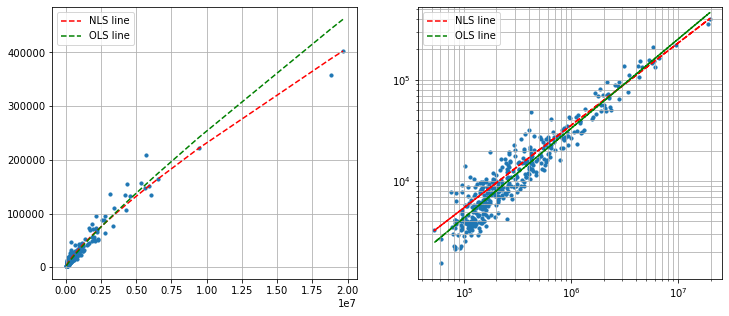

In [153]:
xdata = dfr.groupby(["origin_code"])["population origin"].mean()
ydata = dfr.groupby(["origin_code"])["migration"].sum()

fig,ax = paramsPlot(xdata,ydata)

## Migration to and from other cities

### From small cities

NLS Fit alpha: 2.053754151405012 
NLS Fit beta: 0.7097160827613967 
NLS R2: 0.8987866626853801
************************************************************
OLS Fit alpha: -1.58112938150822 
OLS Fit beta: 0.8684502088794891 
OLS R2: 0.7867318415163792
************************************************************


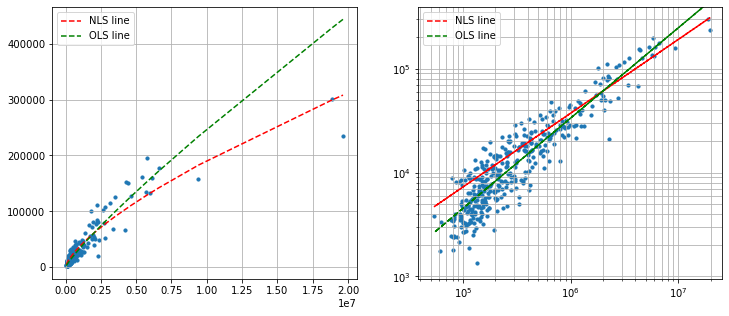

In [154]:
dfr_small = dfr[(dfr["population origin"]<2e5) | (dfr["population origin"]>5e4)]

xdata = dfr_small.groupby(["destiny_code"])["population destiny"].mean()
ydata = dfr_small.groupby(["destiny_code"])["migration"].sum()

fig,ax = paramsPlot(xdata,ydata)

NLS Fit alpha: 1.6223878708936845 
NLS Fit beta: 0.6671329368954665 
NLS R2: 0.8783532139568048
************************************************************
OLS Fit alpha: -1.9238398987244507 
OLS Fit beta: 0.8331308702785928 
OLS R2: 0.7567202184018578
************************************************************


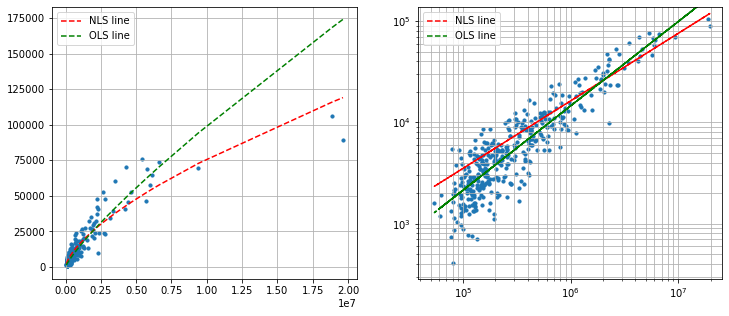

In [157]:
dfr_small = dfr[(dfr["population origin"]<1e6)]

xdata = dfr_small.groupby(["destiny_code"])["population destiny"].mean()
ydata = dfr_small.groupby(["destiny_code"])["migration"].sum()

fig,ax = paramsPlot(xdata,ydata)

### from large cities

NLS Fit alpha: 0.550769061819413 
NLS Fit beta: 0.7016511674988294 
NLS R2: 0.766923249665445
************************************************************
OLS Fit alpha: -5.240142280160918 
OLS Fit beta: 1.0183751357001312 
OLS R2: 0.3432830306169675
************************************************************


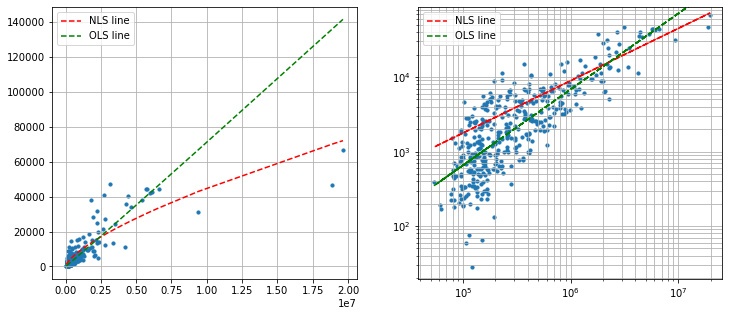

In [159]:
dfr_large = dfr[(dfr["population origin"]>5e6)]

xdata = dfr_large.groupby(["destiny_code"])["population destiny"].mean()
ydata = dfr_large.groupby(["destiny_code"])["migration"].sum()

fig,ax = paramsPlot(xdata,ydata)

NLS Fit alpha: 0.4979638508488107 
NLS Fit beta: 0.6626935399053018 
NLS R2: 0.5969896084300177
************************************************************
OLS Fit alpha: -7.414596962927436 
OLS Fit beta: 1.1180531371807556 
OLS R2: -0.18523296343861895
************************************************************


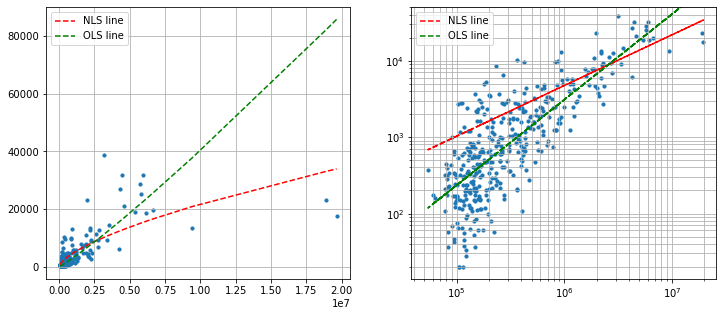

In [160]:
dfr_large = dfr[(dfr["population origin"]>8e6)]

xdata = dfr_large.groupby(["destiny_code"])["population destiny"].mean()
ydata = dfr_large.groupby(["destiny_code"])["migration"].sum()

fig,ax = paramsPlot(xdata,ydata)

### to small cities

NLS Fit alpha: 0.33341014802671837 
NLS Fit beta: 0.8334137913062889 
NLS R2: 0.7514048494921077
************************************************************
OLS Fit alpha: -1.9817149326910837 
OLS Fit beta: 0.8991229259013639 
OLS R2: 0.7459717583213377
************************************************************


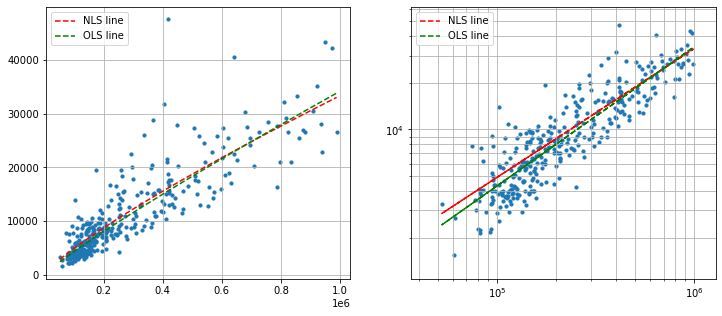

In [161]:
dfr_small_in = dfr[(dfr["population destiny"]<2e5) | (dfr["population destiny"]>5e4)]

xdata = dfr_small.groupby(["origin_code"])["population origin"].mean()
ydata = dfr_small.groupby(["origin_code"])["migration"].sum()

fig,ax = paramsPlot(xdata,ydata)

### to large

NLS Fit alpha: 0.07446622400731297 
NLS Fit beta: 0.8306621070703074 
NLS R2: 0.8249301337660713
************************************************************
OLS Fit alpha: -5.789298661402211 
OLS Fit beta: 1.0463770137298076 
OLS R2: 0.6702137588703945
************************************************************


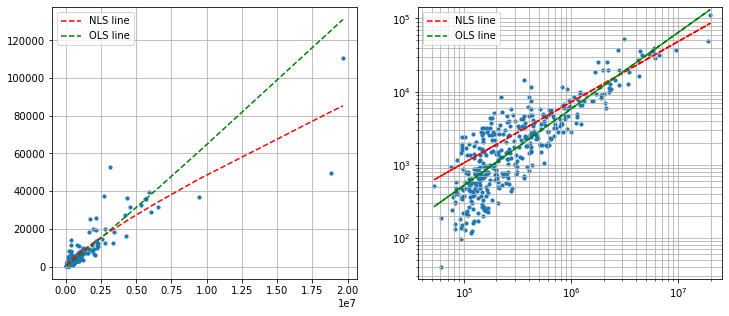

In [162]:
dfr_large_in = dfr[dfr["population destiny"]>5e6]

xdata = dfr_large_in.groupby(["origin_code"])["population origin"].mean()
ydata = dfr_large_in.groupby(["origin_code"])["migration"].sum()

fig,ax = paramsPlot(xdata,ydata)

## model

In [107]:
dfd = pd.read_csv("Migration-master/CitiesDirectory.csv")
gdfd = gpd.GeoDataFrame(dfd, geometry=gpd.points_from_xy(dfd["lon"], dfd["lat"], crs="epsg:4326"))

In [108]:
tessellation = gdfd[["code","population","geometry"]].rename(columns={"code":"tile_ID"})
tessellation

,tile_ID,population,geometry
0,C001,164878,POINT (-99.73314 32.44874)
1,C002,327849,POINT (-67.02435 18.50078)
2,C003,695688,POINT (-81.51901 41.08144)
3,C004,117080,POINT (-123.08797 44.63982)
4,C005,154351,POINT (-84.15848 31.57032)
...,...,...,...
380,C381,242624,POINT (-120.50590 46.60207)
381,C382,433572,POINT (-76.98304 39.80066)
382,C383,553906,POINT (-80.66321 41.07993)
383,C384,165810,POINT (-121.61691 39.14045)


### Gravity

In [68]:
dfr_100 = dfr[dfr.origin_destiny_code.str.contains(r"C0\d{2}C0\d{2}")] 
##TODO: 如何采样100个随机数的?
dfr_100

,origin_destiny_code,origin_code,destiny_code,distance_meters,population origin,population destiny,migration,flux_gravity,sq_error_gravity,flux_scaling,sq_error_scaling,flux_scaling_distance,sq_error_scaling_distance
0,C001C002,C001,C002,3613851,162152,327849,0,2,3,5,25,0,0
1,C001C003,C001,C003,1881755,162152,695688,0,6,31,30,900,15,225
2,C001C004,C001,C004,2430816,162152,117080,0,1,1,10,100,15,225
3,C001C005,C001,C005,1473459,162152,154351,0,1,2,5,25,10,100
4,C001C006,C001,C006,2538522,162152,866964,0,6,30,5,25,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
37725,C099C094,C099,C094,549810,4267585,108393,24,57,1115,35,121,70,2116
37726,C099C095,C099,C095,922019,4267585,151768,0,54,2965,60,3600,40,1600
37727,C099C096,C099,C096,1487191,4267585,592455,821,148,452484,230,349281,135,470596
37728,C099C097,C099,C097,1840272,4267585,2617172,1132,558,329275,1215,6889,530,362404


In [82]:
tessellation_100 = tessellation.iloc[:99,:]
tessellation_100

,tile_ID,population,geometry
0,C001,164878,POINT (-99.73314 32.44874)
1,C002,327849,POINT (-67.02435 18.50078)
2,C003,695688,POINT (-81.51901 41.08144)
3,C004,117080,POINT (-123.08797 44.63982)
4,C005,154351,POINT (-84.15848 31.57032)
...,...,...,...
94,C095,151768,POINT (-86.99877 34.56221)
95,C096,592455,POINT (-81.25188 29.03962)
96,C097,2617172,POINT (-104.95949 39.72677)
97,C098,582353,POINT (-93.71133 41.57721)


```
dfr_s = dfr.sample(1000).reset_index(drop=True)
```
尝试采样
NaN, inf or invalid value detected in weights, estimation infeasible.
转移矩阵对应地方有空值，矩阵非奇



In [83]:
fdf = skmob.FlowDataFrame(dfr_100,origin="origin_code",destination ="destiny_code",flow ="migration",tessellation=tessellation_100)
fdf

,origin_destiny_code,origin,destination,distance_meters,population origin,population destiny,flow,flux_gravity,sq_error_gravity,flux_scaling,sq_error_scaling,flux_scaling_distance,sq_error_scaling_distance
0,C001C002,C001,C002,3613851,162152,327849,0,2,3,5,25,0,0
1,C001C003,C001,C003,1881755,162152,695688,0,6,31,30,900,15,225
2,C001C004,C001,C004,2430816,162152,117080,0,1,1,10,100,15,225
3,C001C005,C001,C005,1473459,162152,154351,0,1,2,5,25,10,100
4,C001C006,C001,C006,2538522,162152,866964,0,6,30,5,25,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
37725,C099C094,C099,C094,549810,4267585,108393,24,57,1115,35,121,70,2116
37726,C099C095,C099,C095,922019,4267585,151768,0,54,2965,60,3600,40,1600
37727,C099C096,C099,C096,1487191,4267585,592455,821,148,452484,230,349281,135,470596
37728,C099C097,C099,C097,1840272,4267585,2617172,1132,558,329275,1215,6889,530,362404


In [84]:
# compute the total outflows from each location of the tessellation (excluding self loops)
tot_outflows = fdf.groupby(by='origin', axis=0)['flow'].sum().fillna(0).values
tessellation_100[constants.TOT_OUTFLOW] = tot_outflows

D:\Miniconda\envs\sds20\lib\site-packages\geopandas\geodataframe.py:853: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [85]:
fdf.plot_flows(flow_color='red')

In [86]:
from skmob.models import Gravity
gravity_singly = Gravity(gravity_type='singly constrained')
print(gravity_singly)

Gravity(name="Gravity model", deterrence_func_type="power_law", deterrence_func_args=[-2.0], origin_exp=1.0, destination_exp=1.0, gravity_type="singly constrained")


In [87]:
# fit the parameters of the Gravity from the FlowDataFrame
gravity_singly.fit(fdf, relevance_column='population')
print(gravity_singly)

Gravity(name="Gravity model", deterrence_func_type="power_law", deterrence_func_args=[-1.3154711414895535], origin_exp=1.0, destination_exp=0.8258269613420834, gravity_type="singly constrained")


In [90]:
# generate the synthetics flows
np.random.seed(0)
synth_fdf_fitted = gravity_singly.generate(tessellation_100,tile_id_column='tile_ID',
                                                  tot_outflows_column='tot_outflow',
                                                  relevance_column= 'population',
                                                  out_format='flows')
# print a portion of the synthetic flows
synth_fdf_fitted.head()

100%|██████████| 99/99 [00:00<00:00, 6597.75it/s]
D:\Miniconda\envs\sds20\lib\site-packages\skmob\models\gravity.py:43: RuntimeWarning: divide by zero encountered in power
  return np.power(x, exponent)


,origin,destination,flow
0,C001,C002,2.872289
1,C001,C003,12.622160
2,C001,C004,2.068716
3,C001,C005,5.027340
4,C001,C006,10.214359


### Radiation

In [93]:
from skmob.models import Radiation
# instantiate a Radiation object
radiation = Radiation()
 # start the simulation
np.random.seed(0)
rad_flows = radiation.generate(tessellation_100, 
				tile_id_column='tile_ID',  
				tot_outflows_column='tot_outflow', 
				relevance_column='population', 
				out_format='flows_sample')
# print a portion of the synthetic flows
rad_flows.head()

100%|██████████| 99/99 [00:00<00:00, 779.76it/s]


,origin,destination,flow
0,C001,C050,1204
1,C001,C088,1695
2,C001,C024,13
3,C001,C011,2
4,C001,C077,1
